<a href="https://colab.research.google.com/github/mariamb81/pattern-recognition-coursework/blob/main/A5_mbusari.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gram Matrix and Sliced Wasserstein Distance Style Methods for Style Transfer

Note:
- View Section 2.1 of document for experimental procedure and results
- View Section 2.2 of document for introduction/explanation of concepts

## Credit



[1]“Neural style transfer,” TensorFlow, 2019. https://www.tensorflow.org/tutorials/generative/style_transfer

[2]T. Chambon, “tchambon/A-Sliced-Wasserstein-Loss-for-Neural-Texture-Synthesis,” GitHub, Feb. 06, 2024. https://github.com/tchambon/A-Sliced-Wasserstein-Loss-for-Neural-Texture-Synthesis?tab=readme-ov-file

## Content and Style Images

### Content

Image of a dog:

<img src="https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg" width="500px"/>

[Yellow Labrador Looking](https://commons.wikimedia.org/wiki/File:YellowLabradorLooking_new.jpg), from Wikimedia Commons by [Elf](https://en.wikipedia.org/wiki/User:Elf). License [CC BY-SA 3.0](https://creativecommons.org/licenses/by-sa/3.0/deed.en)

### Style
Wassily Kandinsky's Composition 7
<img src="https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg"/>


What would it look like if Kandinsky decided to paint the picture of this Dog?

## Setup

### Import and configure modules

In [ ]:
import os
import tensorflow as tf

In [ ]:
import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import PIL.Image
import time
import functools
import torch

In [ ]:
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
# set parameters for graphs
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

In [ ]:
# set experiment name
experiment_name = "ex3"

In [ ]:
# converts a tensor to a PIL (Python Imaging Library) image
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)


Download images and choose a style image and a content image:

In [ ]:
# content and style image paths
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

In [ ]:
style_path = "van-gogh.jpg"

## Visualize the input

In [ ]:
# Define a function to load an image and limit its maximum dimension to 512 pixels.
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

# create a function to display an image
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

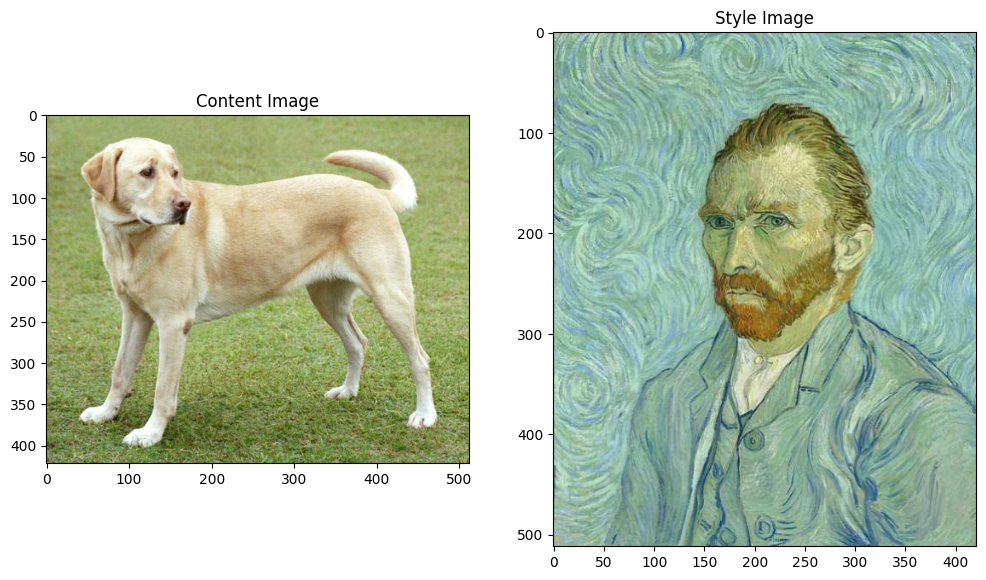

In [ ]:
# load and display content and style image
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [ ]:
# display images in a grid format
# input: tensor
def img_grid_set(rows=2, cols=2, figsize=(8, 8)):
  fig, axes = plt.subplots(rows, cols, figsize=figsize)

def plot_img_grid(image, row, col, count=1, title=None):
  plt.subplot(row, col, count)
  plt.imshow(image)
  plt.axis('off')
  if title:
    plt.title(title)

## Save Image

In [ ]:
def save_result(file_name, image):
  tensor_to_image(image).save(file_name)

  try:
    from google.colab import files
  except ImportError:
    pass
  else:
    files.download(file_name)

## Note:
The tutorial included a demonstration of fast style transfer using TF-Hub however, we will be working with the original style transfer algorithm

## Define content and style representations

Use the intermediate layers of the model to get the *content* and *style* representations of the image. Starting from the network's input layer, the first few layer activations represent low-level features like edges and textures. As you step through the network, the final few layers represent higher-level features—object parts like *wheels* or *eyes*. In this case, you are using the VGG19 network architecture, a pretrained image classification network. These intermediate layers are necessary to define the representation of content and style from the images. For an input image, try to match the corresponding style and content target representations at these intermediate layers.

We have already loaded a [VGG19](https://keras.io/api/applications/vgg/#vgg19-function) and test run it on our image to ensure it's used correctly in the tutorial, so this step is ommitted.


In [ ]:
# load a `VGG19` without the classification head, and list the layer names
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_7
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


### Choose intermediate layers from the network to represent the style and content of the image:


In [ ]:
# choose content and style layers
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1'
                ]

# number of content and style letters
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

#### Intermediate layers for style and content

So why do these intermediate outputs within our pretrained image classification network allow us to define style and content representations?

At a high level, in order for a network to perform image classification (which this network has been trained to do), it must understand the image. This requires taking the raw image as input pixels and building an internal representation that converts the raw image pixels into a complex understanding of the features present within the image.

This is also a reason why convolutional neural networks are able to generalize well: they’re able to capture the invariances and defining features within classes (e.g. cats vs. dogs) that are agnostic to background noise and other nuisances. Thus, somewhere between where the raw image is fed into the model and the output classification label, the model serves as a complex feature extractor. By accessing intermediate layers of the model, you're able to describe the content and style of input images.

## Build the model

The networks in `tf.keras.applications` are designed so you can easily extract the intermediate layer values using the Keras functional API.

To define a model using the functional API, specify the inputs and outputs:

`model = Model(inputs, outputs)`

In [ ]:
# builds a VGG19 model that returns a list of intermediate layer outputs:

def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  # get layers from VGG model
  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

Create the model:

In [ ]:
# create a style extractor using the specified style layers of VGG19
style_extractor = vgg_layers(style_layers)

# extract style features from the style image and multiply by 255
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 512, 421, 64)
  min:  0.0
  max:  732.2883
  mean:  28.542171

block2_conv1
  shape:  (1, 256, 210, 128)
  min:  0.0
  max:  2369.0813
  mean:  156.05075

block3_conv1
  shape:  (1, 128, 105, 256)
  min:  0.0
  max:  7845.261
  mean:  136.34848

block4_conv1
  shape:  (1, 64, 52, 512)
  min:  0.0
  max:  15379.034
  mean:  536.9022

block5_conv1
  shape:  (1, 32, 26, 512)
  min:  0.0
  max:  2800.3186
  mean:  46.56248



# Gram Matrix

## Calculate style

The content of an image is represented by the values of the intermediate feature maps.

It turns out, the style of an image can be described by the means and correlations across the different feature maps. Calculate a Gram matrix that includes this information by taking the outer product of the feature vector with itself at each location, and averaging that outer product over all locations. This Gram matrix can be calculated for a particular layer as:

$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

This can be implemented concisely using the `tf.linalg.einsum` function:

In [ ]:
# calculate the gram matrix for a layer given an input tensor

def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

## Extract style and content


Build a model that returns the style and content tensors.

In [ ]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers, loss_type='gm'):
    super(StyleContentModel, self).__init__()

    # create vgg19 model with specified style and content layers
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.loss_type = loss_type
    self.num_style_layers = len(style_layers)
    # vgg19 model is non-trainable
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    # scale to range (0, 255)
    inputs = inputs*255.0
    # preprocess input for VGG19 model
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    # input into VGG19 model
    outputs = self.vgg(preprocessed_input)
    # split outputs into style and content
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])
    if self.loss_type == 'gm':
      # convert style outputs to Gram matrices
      style_outputs = [gram_matrix(style_output)
                      for style_output in style_outputs]

    # content and style dictionaries {name: value}
    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    # return dictionaries
    return {'content': content_dict, 'style': style_dict}

When called on an image, this model returns the gram matrix (style) of the `style_layers` and content of the `content_layers`:

In [ ]:
# initialize model extractor
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())


Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.005522845
    max:  28014.555
    mean:  263.79022

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  61479.484
    mean:  9100.949

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  545623.44
    mean:  7660.976

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4320502.0
    mean:  134288.84

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  110005.37
    mean:  1487.0378

Contents:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764149


## Run gradient descent

With this style and content extractor, you can now implement the style transfer algorithm. Do this by calculating the mean square error for your image's output relative to each target, then take the weighted sum of these losses.

Set your style and content target values:

In [ ]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

Define a `tf.Variable` to contain the image to optimize. To make this quick, initialize it with the content image (the `tf.Variable` must be the same shape as the content image):

In [ ]:
# initialize a tf.Variable with the content image
image = tf.Variable(content_image)

Since this is a float image, define a function to keep the pixel values between 0 and 1:

In [ ]:
# scale pixel values to (0, 1)
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Create an optimizer. The paper recommends LBFGS, but Adam works okay, too:

In [ ]:
# create an Adam optimizer with learning rate of 0.02 beta1 of 0.99 and epsilon of 0.1
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

To optimize this, use a weighted combination of the two losses to get the total loss:

In [ ]:
# TODO change weights
style_weight=1e-2
content_weight=1e4

In [ ]:
# calculate a total loss using weighted average of the style and content loss
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']

    # calculate style loss
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    # scale by style weight
    style_loss *= style_weight / num_style_layers

    # calculate content loss
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    # scale by content weight
    content_loss *= content_weight / num_content_layers
    # combine to get total loss
    loss = style_loss + content_loss
    return loss

In [ ]:
# Choose a weight for the total_variation_loss:
total_variation_weight=30

Use `tf.GradientTape` to update the image.

In [ ]:
@tf.function()
def train_step_gm(image):
  with tf.GradientTape() as tape:
    # input into model to produce outputs
    outputs = extractor(image)
    # calculate the total loss
    loss = style_content_loss(outputs)
    # add total variation loss
    loss += total_variation_weight*tf.image.total_variation(image)
  # calculate the gradient with respect to the image
  grad = tape.gradient(loss, image)

  # apply optimizer to calculate gradient and update image
  opt.apply_gradients([(grad, image)])
  # scale to range (0, 1)
  image.assign(clip_0_1(image))

Since it's working, perform a longer optimization:

In [ ]:
import time
# complete training steps m times for each epoch
def train_loop(image, epochs = 10, steps_per_epoch = 100):
  start = time.time()
  step = 0
  for n in range(epochs):
    for m in range(steps_per_epoch):
      step += 1
      # complete training step
      train_step_gm(image)
      print(".", end='', flush=True)
    display.clear_output(wait=True)
    # display image
    display.display(tensor_to_image(image))
    plot_img_grid(tensor_to_image(image), 2, 5, n+1, f'Train step: {step}')
    print("Train step: {}".format(step))

  end = time.time()
  print("Total time: {:.1f}".format(end-start))
  # return image

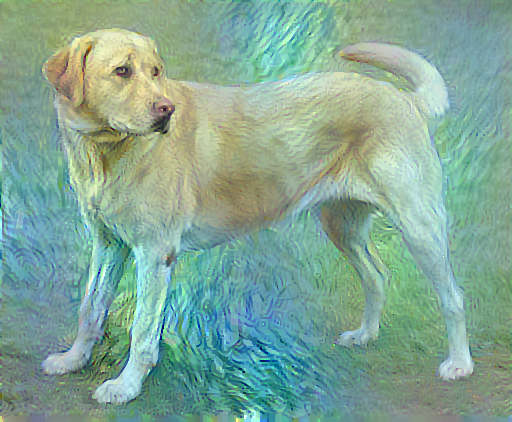

Train step: 1000
Total time: 75.3


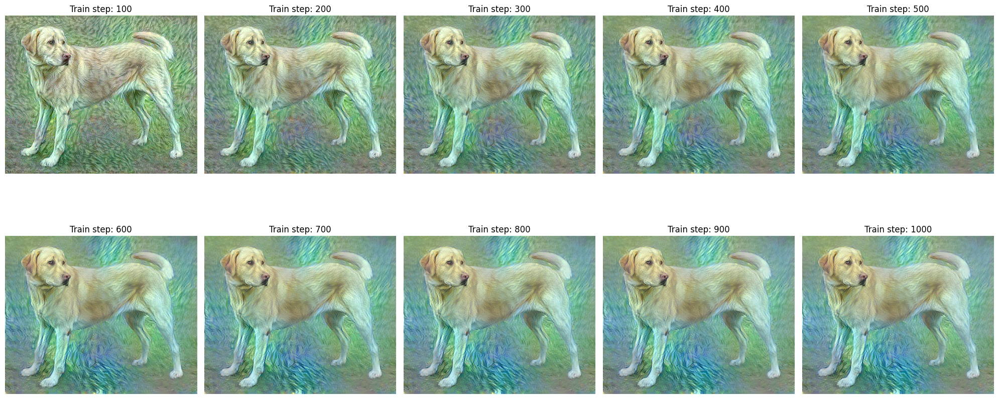

In [ ]:
# img_grid_set(2, 5, figsize=(20, 19))
fig = plt.figure(figsize = (20, 10))

# train loop GMM
train_loop(image)
plt.tight_layout()
plt.show()
plt.close()

In [ ]:
# save image
save_result(f'output_gm_{experiment_name}.png', image)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Slice Wasserstein Loss
1. define content and style representations
- use a pretrained cnn (vgg19)
- The content representation is usually drawn from deeper layers of the network, where higher-level features are captured. The style representation, on the other hand, is derived from multiple layers throughout the network to capture a range of style features at different scales.
2. calculate


In [ ]:
import torch
import imageio

In [ ]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

In [ ]:
def prepare_image(image_path):
    # Read and decode the image; ensure 'channels=3' to get 3 color channels.
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3, dtype=tf.float32)
    # resize to 224 by 224
    image = tf.keras.applications.vgg19.preprocess_input(image*255)
    image = tf.image.resize(image, (224, 224))

    # Add a batch dimension
    image = tf.expand_dims(image, axis=0)

    # ensure the height and width are divisible by 8
    shape = tf.shape(image)
    new_height = shape[1] - tf.math.mod(shape[1], 8)
    new_width = shape[2] - tf.math.mod(shape[2], 8)
    image = tf.image.crop_to_bounding_box(image, 0, 0, new_height, new_width)

    return image

In [ ]:
def prepare_image(image_path):
    # Read and decode the image; ensure 'channels=3' to get 3 color channels.
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)
    # resize to 224 by 224
    image = tf.image.resize(image, (224, 224))
    image = tf.keras.applications.vgg19.preprocess_input(image)

    # Add a batch dimension
    return image[tf.newaxis, :]  # Add batch dimension


In [ ]:
content_image = prepare_image(content_path)
style_image = prepare_image(style_path)
print(content_image.shape)
print(style_image.shape)

(1, 224, 224, 3)
(1, 224, 224, 3)


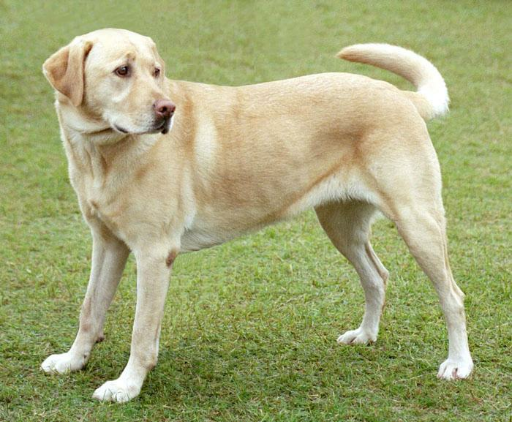

In [ ]:
content_image = load_img(content_path)
style_image = load_img(style_path)
tensor_to_image(content_image)

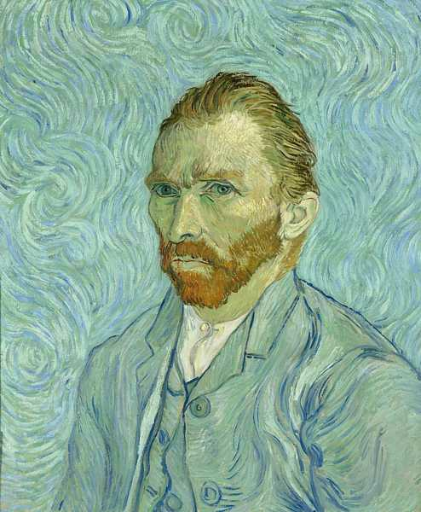

In [ ]:
tensor_to_image(style_image)

In [ ]:
def crop_tensors(activations_style, activations_generated):
    # determine the size of the second dimension for both tensors
    size_style = tf.shape(activations_style)[1]
    size_generated = tf.shape(activations_generated)[1]

    # find the min size to ensure both tensors have the same shape in the second dimension
    min_size = tf.minimum(size_style, size_generated)

    # Crop both tensors to have the same second dimension
    activations_style_adjusted = activations_style[:, :min_size, :]
    activations_generated_adjusted = activations_generated[:, :min_size, :]

    return activations_style_adjusted, activations_generated_adjusted

In [ ]:
style_model = vgg_layers(style_layers)

In [ ]:
# sliced wasserstein distance loss
def slicing_loss(image_generated, image_style):
    # Generate VGG19 activations
    list_activations_generated = style_model(image_generated)
    list_activations_style = style_model(image_style)
    # print(list_activations_style)
    loss = 0
    for l in range(len(list_activations_style)):
        activations_style = tf.reshape(list_activations_style[l], [list_activations_style[l].shape[0], -1, list_activations_style[l].shape[-1]])
        activations_generated = tf.reshape(list_activations_generated[l], [list_activations_generated[l].shape[0], -1, list_activations_generated[l].shape[-1]])

        # # of directions
        Ndirection = activations_style.shape[-1]
        # sample random directions
        directions = tf.random.normal((Ndirection, Ndirection))
        directions = directions / tf.sqrt(tf.reduce_sum(tf.square(directions), axis=1, keepdims=True))

        # project activations over random directions
        projected_activations_style = tf.einsum('bmn,nd->bmd', activations_style, directions)
        projected_activations_generated = tf.einsum('bmn,nd->bmd', activations_generated, directions)

        # sort the projections
        sorted_activations_style = tf.sort(projected_activations_style, axis=-1)
        sorted_activations_generated = tf.sort(projected_activations_generated, axis=-1)

        sorted_activations_style, sorted_activations_generated = crop_tensors(sorted_activations_style, sorted_activations_generated)
        # L2 loss over sorted lists
        loss += tf.reduce_mean(tf.square((sorted_activations_style) - (sorted_activations_generated)))

    return loss

In [ ]:
content_model = vgg_layers(content_layers)

In [ ]:
def content_loss(outputs, target):
      return tf.reduce_mean(tf.square(outputs - target))

In [ ]:
def total_content_loss(image_generated, content_image):
  content_features = [content_model(content_image)]
  generated_features = [content_model(image_generated)]
  # print(content_features)
  # summ content loss for each layer
  total_content_loss = tf.add_n([content_loss(content, generated) for content, generated in zip(content_features, generated_features)])
  return total_content_loss

## Training Loop

In [ ]:
image_generated = tf.Variable(content_image)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02)

In [ ]:
total_variation_weight = 1e-6
content_weight = 1
style_weight = 0.5

In [ ]:
@tf.function
def train_step(image_generated, image_style):
    with tf.GradientTape() as tape:
        # content loss
        content_loss = total_content_loss(image_generated, content_image)
        content_loss *= content_weight / num_content_layers
        # WSD - based style loss
        style_loss = slicing_loss(image_generated, image_style)
        style_loss *= style_weight / num_style_layers
        # total variation loss
        tv_loss = total_variation_weight*tf.image.total_variation(image_generated)
        loss = content_loss + style_loss + tv_loss
    # Compute gradients of loss with respect to the generated image
    gradients = tape.gradient(loss, image_generated)
    # Apply gradients to update the generated image
    optimizer.apply_gradients([(gradients, image_generated)])
    image_generated.assign(clip_0_1(image_generated))

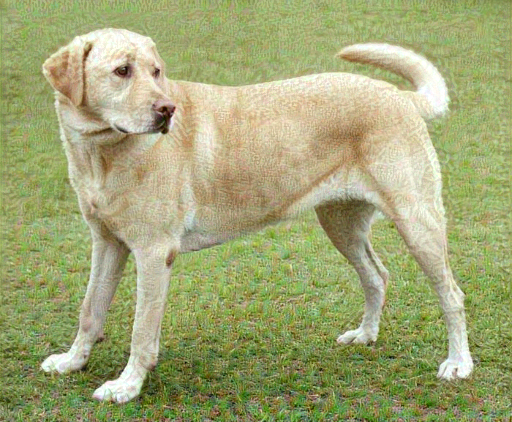

In [ ]:
train_step(image_generated, style_image)
train_step(image_generated, style_image)
train_step(image_generated, style_image)
tensor_to_image(image_generated)

In [ ]:
import time
# complete training steps m times for each epoch
def train_loop(epochs = 10, steps_per_epoch = 100):
  start = time.time()
  step = 0
  for n in range(epochs):
    for m in range(steps_per_epoch):
      step += 1

      # complete training step
      train_step(image_generated, style_image)
      print(".", end='', flush=True)
    display.clear_output(wait=True)
    # display image
    display.display(tensor_to_image(image_generated))
    plot_img_grid(tensor_to_image(image_generated), 2, 5, n+1, f'Train step: {step}')
    print("Train step: {}".format(step))
  end = time.time()
  print("Total time: {:.1f}".format(end-start))
  # return image

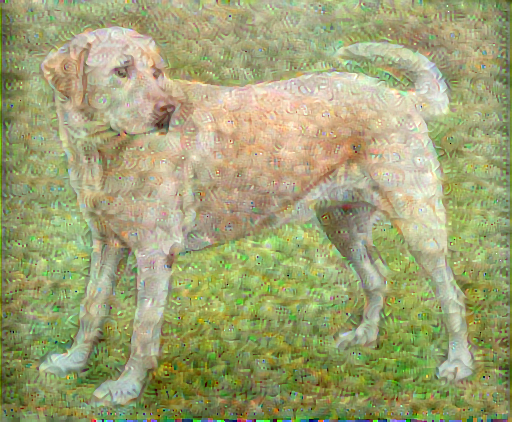

Train step: 1000
Total time: 1007.2


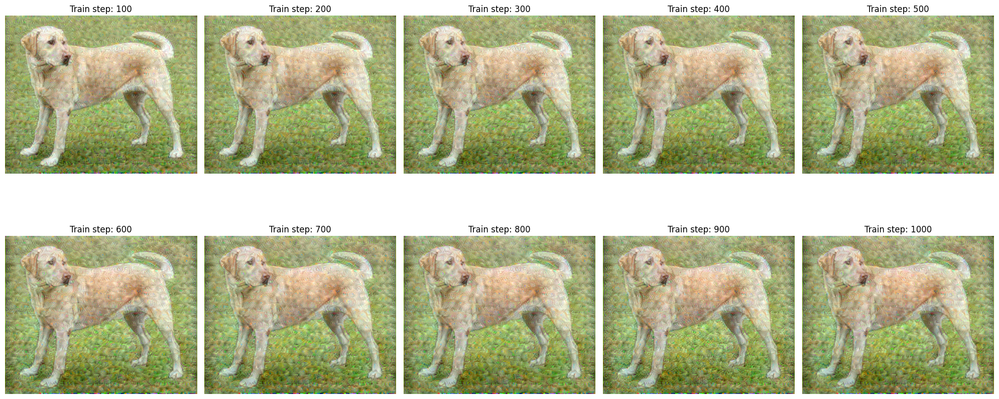

In [ ]:
fig = plt.figure(figsize = (20, 10))
# train loop WSD
train_loop(epochs = 10, steps_per_epoch = 100)
plt.tight_layout()
plt.show()
plt.close()

# Save Results

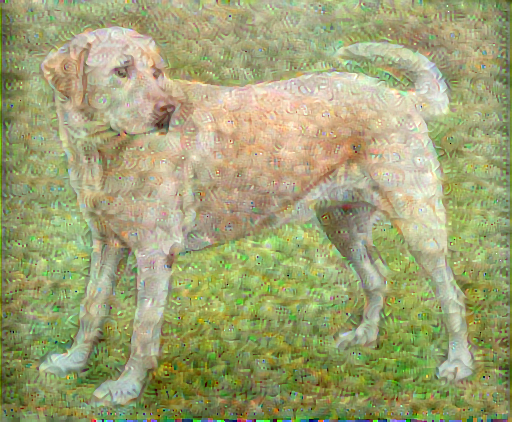

In [ ]:
# convert to image
tensor_to_image(image_generated)

In [ ]:
def save_result(file_name, image):
  tensor_to_image(image).save(file_name)

  try:
    from google.colab import files
  except ImportError:
    pass
  else:
    files.download(file_name)

In [ ]:
save_result(f'output_swd_{experiment_name}.png', image_generated)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Numerical Metrics
- Structural Similarity Index (SSIM) https://www.tensorflow.org/api_docs/python/tf/image/ssim
- Peak Signal-to-Noise Ratio (PSNR) https://www.tensorflow.org/api_docs/python/tf/image/psnr
- Edge Loss

In [ ]:
output_img_swd = f'output_swd_{experiment_name}.png'
output_img_gm = f'output_gm_{experiment_name}.png'

In [ ]:
# calculate SSIM over two images
def calculate_SSIM(img1, img2):
  img1 = prepare_image(img1)
  img2 = prepare_image(img2)

  ssim_index = tf.image.ssim(img1, img2, max_val=1.0)

  # Since SSIM can be part of a computational graph, if you want to print it, you may need to evaluate the tensor
  ssim_value = ssim_index.numpy()
  return ssim_value
  # print("SSIM: ", ssim_value)

In [ ]:
# Calculate PSNR over two images
def calculate_psnr(img1, img2):
  img1 = prepare_image(img1)
  img2 = prepare_image(img2)
  # print(img1)
  psnr = tf.image.psnr(img1, img2, max_val=255)
  # To evaluate and print the PSNR value (if in eager execution mode)
  psnr_value = psnr.numpy()
  return psnr_value
  # print('PSNR:', psnr_value)

In [ ]:
def calculate_edge_loss(content_image, output_image):
  content_image = prepare_image(content_image)
  output_image = prepare_image(output_image)
  sobel_content = tf.image.sobel_edges(content_image)
  sobel_output = tf.image.sobel_edges(output_image)
  edge_loss = tf.reduce_mean(tf.square(sobel_content - sobel_output))
  return edge_loss
  # print('Edge Loss:', edge_loss)

In [ ]:
def numerical_metrics_analysis(output):
  # calculate ssim
  ssim_output_content = calculate_SSIM(output, content_path)
  ssim_output_style = calculate_SSIM(output, style_path)
  print(f"SSIM Output-Content: {ssim_output_content}")
  print(f"SSIM Output-Style: {ssim_output_style}")
  # calculate psnr
  psnr_output_content = calculate_psnr(content_path, output)
  print(f"PSNR Output-Content: {psnr_output_content}")
  # calculate edge loss
  edgeloss_output_content = calculate_edge_loss(content_path, output)
  print(f"Edge Loss Output-Content: {edgeloss_output_content}")


In [ ]:
# output_img_swd = f'output_swd_ex1.png'
# output_img_gm = f'output_gm_ex1.png'

In [ ]:
numerical_metrics_analysis(output_img_gm)

SSIM Output-Content: [0.1735055]
SSIM Output-Style: [0.00055205]
PSNR Output-Content: [16.197609]
Edge Loss Output-Content: 5776.5234375


In [ ]:
numerical_metrics_analysis(output_img_swd)

SSIM Output-Content: [0.18217593]
SSIM Output-Style: [0.00369093]
PSNR Output-Content: [19.43435]
Edge Loss Output-Content: 7528.74560546875
